In [58]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import FunctionTransformer
from sklearn.impute import SimpleImputer
from sklearn.feature_extraction import FeatureHasher
from imblearn.over_sampling import SMOTE
from sklearn.feature_selection import mutual_info_classif
import math

In [59]:
df = pd.read_csv('../../Resource/address_dataset_kaggle.csv', index_col=0)

# 1. Cleaning data: Imputasi nilai yang hilang
columns_drop = ['Index', 'Address']  # Kolom yang ingin dibuang
df = df.drop(columns=columns_drop)

In [60]:
# Imputasi untuk kolom numerik (mengisi NaN dengan rata-rata)
num_cols = df.select_dtypes(include=['float64', 'int64']).columns
num_imputer = SimpleImputer(strategy='mean')
df[num_cols] = num_imputer.fit_transform(df[num_cols])

# Imputasi untuk kolom kategori (mengisi NaN dengan modus)
cat_cols = df.select_dtypes(include=['object']).columns
cat_imputer = SimpleImputer(strategy='most_frequent')
df[cat_cols] = cat_imputer.fit_transform(df[cat_cols])

In [61]:
# 2. Ubah kolom kategori menjadi numerik menggunakan FeatureHasher
X = df.drop(columns=['FLAG'])
y = df['FLAG']

In [62]:
hasher = FeatureHasher(n_features=20, input_type='string')  # Tentukan jumlah fitur hasil hash
cat_cols_in_X = X.select_dtypes(include=['object']).columns

for col in cat_cols_in_X:
    data_to_hash = X[col].astype(str).values.reshape(-1, 1)
    hashed_features = hasher.transform(data_to_hash).toarray()
    hashed_df = pd.DataFrame(hashed_features, columns=[f"{col}_hashed_{i}" for i in range(hashed_features.shape[1])])
    X = pd.concat([X, hashed_df], axis=1)
    X.drop(columns=[col], inplace=True)

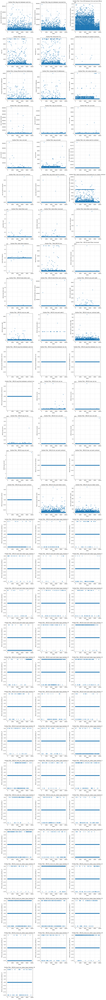

In [63]:
# 3. Visualisasi Outlier menggunakan Scatter Plot
num_cols_in_X = X.select_dtypes(include=['float64', 'int64']).columns

# Menentukan jumlah subplot yang dibutuhkan
n_rows = math.ceil(len(num_cols_in_X) / 3)  # Menyesuaikan jumlah baris plot (maksimal 3 kolom per baris)
plt.figure(figsize=(15, 5 * n_rows))

# Visualisasi setiap kolom numerik dengan scatter plot
for idx, col in enumerate(num_cols_in_X, 1):
    plt.subplot(n_rows, 3, idx)  # Menyesuaikan grid plot dengan jumlah kolom
    plt.scatter(range(len(X)), X[col], alpha=0.5)
    plt.title(f'Outlier Plot: {col}')
    plt.xlabel('Index')
    plt.ylabel(col)
    plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

In [64]:
# 4. Menangani Outlier dengan Log Transformasi
# Mengganti nilai yang <= 0 dengan angka kecil sebelum transformasi log
X_safe = X.copy()

# Pastikan tidak ada nilai <= 0 dalam dataset
X_safe[num_cols_in_X] = X_safe[num_cols_in_X].apply(lambda col: col.apply(lambda x: x if x > 0 else 0.001))

# Terapkan log transformasi menggunakan FunctionTransformer
log_transformer = FunctionTransformer(np.log1p, validate=True)

# Terapkan transformasi log
X_log = log_transformer.fit_transform(X_safe[num_cols_in_X])

# Gabungkan hasil kembali ke DataFrame
X_log = pd.DataFrame(X_log, columns=num_cols_in_X)

# Gantikan kolom yang telah ditransformasi kembali ke DataFrame X
X[num_cols_in_X] = X_log

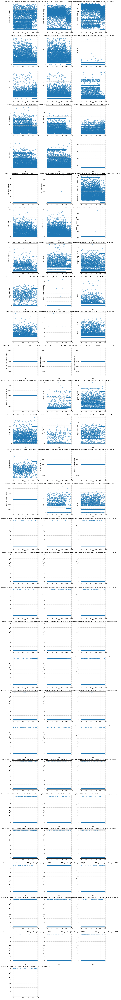

In [65]:
# Visualisasi hasil setelah log transformasi
plt.figure(figsize=(15, 5 * n_rows))
for idx, col in enumerate(X_log.columns, 1):
    plt.subplot(n_rows, 3, idx)
    plt.scatter(range(len(X_log)), X_log[col], alpha=0.5)
    plt.title(f'Distribusi Data setelah Log Transform untuk {col}')
    plt.xlabel('Index')
    plt.ylabel(col)
    plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

In [66]:
# 5. Seleksi Fitur dengan Mutual Information
mutual_info = mutual_info_classif(X, y)
mutual_info_df = pd.DataFrame({
    'Feature': X.columns,
    'Mutual Information': mutual_info
})

# Menampilkan nilai mutual information untuk setiap fitur
print(mutual_info_df)

                                    Feature  Mutual Information
0                  Avg min between sent tnx            0.094247
1              Avg min between received tnx            0.101591
2   Time Diff between first and last (Mins)            0.238081
3                                  Sent tnx            0.070491
4                              Received Tnx            0.116186
..                                      ...                 ...
80      ERC20_most_rec_token_type_hashed_15            0.004911
81      ERC20_most_rec_token_type_hashed_16            0.000000
82      ERC20_most_rec_token_type_hashed_17            0.000000
83      ERC20_most_rec_token_type_hashed_18            0.008066
84      ERC20_most_rec_token_type_hashed_19            0.000000

[85 rows x 2 columns]


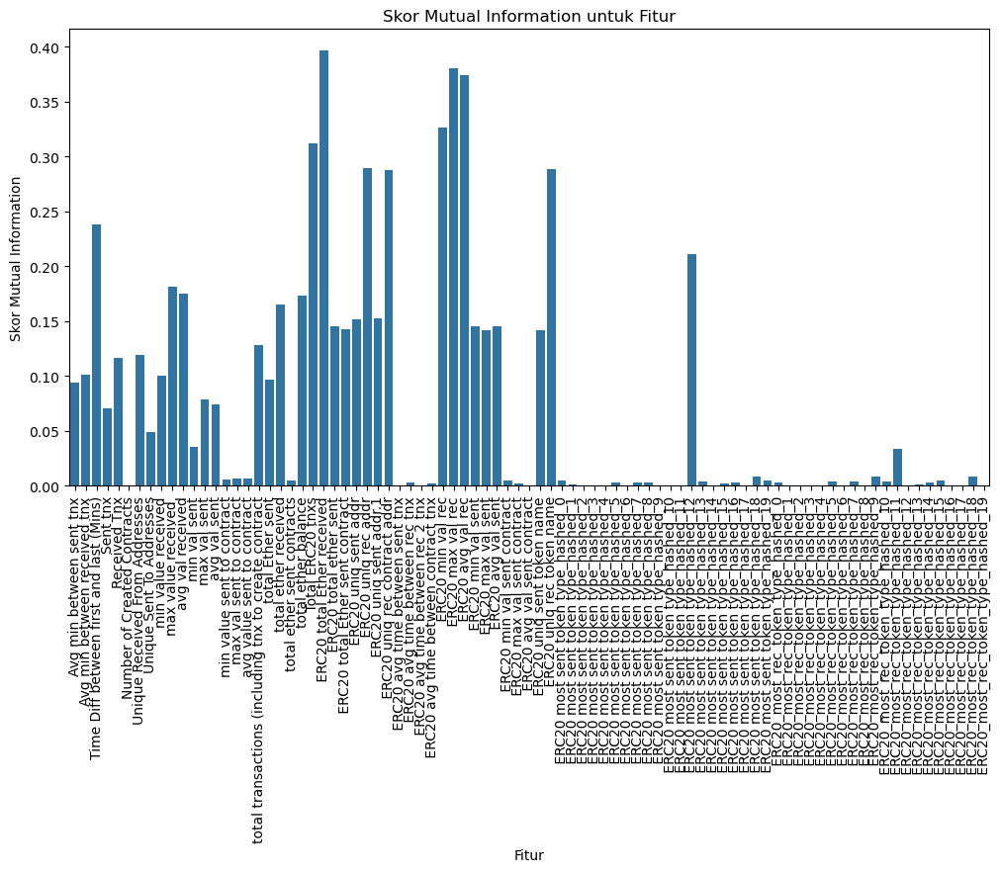

In [67]:
plt.figure(figsize=(12, 6))
sns.barplot(x='Feature', y='Mutual Information', data=mutual_info_df)
plt.title('Skor Mutual Information untuk Fitur')
plt.xlabel('Fitur')
plt.ylabel('Skor Mutual Information')
plt.xticks(rotation=90)
plt.show()

In [68]:
threshold = 0.05  # Menggunakan threshold yang lebih rendah
relevant_features = mutual_info_df[mutual_info_df['Mutual Information'] > threshold]

# Menampilkan fitur yang relevan beserta skor
print("Fitur yang relevan berdasarkan mutual information (skor > threshold):")
if not relevant_features.empty:
    for _, row in relevant_features.iterrows():
        print(f"Fitur: {row['Feature']}, Skor Mutual Information: {row['Mutual Information']:.4f}")
else:
    print("Tidak ada fitur yang relevan dengan skor lebih besar dari threshold.")


Fitur yang relevan berdasarkan mutual information (skor > threshold):
Fitur: Avg min between sent tnx, Skor Mutual Information: 0.0942
Fitur: Avg min between received tnx, Skor Mutual Information: 0.1016
Fitur: Time Diff between first and last (Mins), Skor Mutual Information: 0.2381
Fitur: Sent tnx, Skor Mutual Information: 0.0705
Fitur: Received Tnx, Skor Mutual Information: 0.1162
Fitur: Unique Received From Addresses, Skor Mutual Information: 0.1191
Fitur: min value received, Skor Mutual Information: 0.1002
Fitur: max value received , Skor Mutual Information: 0.1812
Fitur: avg val received, Skor Mutual Information: 0.1752
Fitur: max val sent, Skor Mutual Information: 0.0789
Fitur: avg val sent, Skor Mutual Information: 0.0742
Fitur: total transactions (including tnx to create contract, Skor Mutual Information: 0.1283
Fitur: total Ether sent, Skor Mutual Information: 0.0967
Fitur: total ether received, Skor Mutual Information: 0.1652
Fitur: total ether balance, Skor Mutual Informatio

In [69]:
# Menyaring dataset berdasarkan fitur yang relevan
if not relevant_features.empty:
    X_selected = X[relevant_features['Feature']]
else:
    # Jika tidak ada fitur yang memenuhi threshold, gunakan semua fitur
    print("Tidak ada fitur yang memenuhi threshold, menggunakan semua fitur.")
    X_selected = X

In [70]:
X_selected.columns

Index(['Avg min between sent tnx', 'Avg min between received tnx',
       'Time Diff between first and last (Mins)', 'Sent tnx', 'Received Tnx',
       'Unique Received From Addresses', 'min value received',
       'max value received ', 'avg val received', 'max val sent',
       'avg val sent', 'total transactions (including tnx to create contract',
       'total Ether sent', 'total ether received', 'total ether balance',
       ' Total ERC20 tnxs', ' ERC20 total Ether received',
       ' ERC20 total ether sent', ' ERC20 total Ether sent contract',
       ' ERC20 uniq sent addr', ' ERC20 uniq rec addr',
       ' ERC20 uniq sent addr.1', ' ERC20 uniq rec contract addr',
       ' ERC20 min val rec', ' ERC20 max val rec', ' ERC20 avg val rec',
       ' ERC20 min val sent', ' ERC20 max val sent', ' ERC20 avg val sent',
       ' ERC20 uniq sent token name', ' ERC20 uniq rec token name',
       ' ERC20 most sent token type_hashed_12'],
      dtype='object')

In [71]:
X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)

In [72]:
# 7. Oversampling untuk menangani kelas minoritas menggunakan SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

In [73]:
print(X_train_smote.shape)
print(y_train_smote.shape)
print(X_test.shape)
print(y_test.shape)

(12240, 32)
(12240,)
(1969, 32)
(1969,)


In [74]:
# 8. Menyimpan hasil oversampling ke file CSV
X_train_smote.to_csv("../../Data/mutual-info/n=20/0,05/X_train_smote.csv", index=False)
X_test.to_csv("../../Data/mutual-info/n=20/0,05/X_test.csv", index=False)
y_train_smote.to_csv("../../Data/mutual-info/n=20/0,05/y_train_smote.csv", index=False)
y_test.to_csv("../../Data/mutual-info/n=20/0,05/y_test.csv", index=False)

print("Proses telah selesai. Data oversampling telah disimpan ke dalam CSV.")

Proses telah selesai. Data oversampling telah disimpan ke dalam CSV.


In [75]:
# import pandas as pd
# import numpy as np
# import seaborn as sns
# import matplotlib.pyplot as plt
# from sklearn.model_selection import train_test_split
# from sklearn.preprocessing import FunctionTransformer
# from sklearn.impute import SimpleImputer
# from sklearn.feature_extraction import FeatureHasher
# from imblearn.over_sampling import SMOTE
# from sklearn.feature_selection import mutual_info_classif
# import math

# # Memuat data
# df = pd.read_csv('../../Resource/address_dataset_kaggle.csv', index_col=0)

# # 1. Cleaning data: Imputasi nilai yang hilang
# columns_drop = ['Index', 'Address']  # Kolom yang ingin dibuang
# df = df.drop(columns=columns_drop)

# # Imputasi untuk kolom numerik (mengisi NaN dengan rata-rata)
# num_cols = df.select_dtypes(include=['float64', 'int64']).columns
# num_imputer = SimpleImputer(strategy='mean')
# df[num_cols] = num_imputer.fit_transform(df[num_cols])

# # Imputasi untuk kolom kategori (mengisi NaN dengan modus)
# cat_cols = df.select_dtypes(include=['object']).columns
# cat_imputer = SimpleImputer(strategy='most_frequent')
# df[cat_cols] = cat_imputer.fit_transform(df[cat_cols])

# # 2. Ubah kolom kategori menjadi numerik menggunakan FeatureHasher
# X = df.drop(columns=['FLAG'])
# y = df['FLAG']

# hasher = FeatureHasher(n_features=10, input_type='string')  # Tentukan jumlah fitur hasil hash
# cat_cols_in_X = X.select_dtypes(include=['object']).columns

# for col in cat_cols_in_X:
#     data_to_hash = X[col].astype(str).values.reshape(-1, 1)
#     hashed_features = hasher.transform(data_to_hash).toarray()
#     hashed_df = pd.DataFrame(hashed_features, columns=[f"{col}_hashed_{i}" for i in range(hashed_features.shape[1])])
#     X = pd.concat([X, hashed_df], axis=1)
#     X.drop(columns=[col], inplace=True)

# # 3. Visualisasi Outlier menggunakan Scatter Plot
# num_cols_in_X = X.select_dtypes(include=['float64', 'int64']).columns

# # Menentukan jumlah subplot yang dibutuhkan
# n_rows = math.ceil(len(num_cols_in_X) / 3)  # Menyesuaikan jumlah baris plot (maksimal 3 kolom per baris)
# plt.figure(figsize=(15, 5 * n_rows))

# # Visualisasi setiap kolom numerik dengan scatter plot
# for idx, col in enumerate(num_cols_in_X, 1):
#     plt.subplot(n_rows, 3, idx)  # Menyesuaikan grid plot dengan jumlah kolom
#     plt.scatter(range(len(X)), X[col], alpha=0.5)
#     plt.title(f'Outlier Plot: {col}')
#     plt.xlabel('Index')
#     plt.ylabel(col)
#     plt.grid(True, linestyle='--', alpha=0.7)

# plt.tight_layout()
# plt.show()

# # 4. Menangani Outlier dengan Log Transformasi
# # Mengganti nilai yang <= 0 dengan angka kecil sebelum transformasi log
# X_safe = X.copy()

# # Pastikan tidak ada nilai <= 0 dalam dataset
# X_safe[num_cols_in_X] = X_safe[num_cols_in_X].apply(lambda col: col.apply(lambda x: x if x > 0 else 0.001))

# # Terapkan log transformasi menggunakan FunctionTransformer
# log_transformer = FunctionTransformer(np.log1p, validate=True)

# # Terapkan transformasi log
# X_log = log_transformer.fit_transform(X_safe[num_cols_in_X])

# # Gabungkan hasil kembali ke DataFrame
# X_log = pd.DataFrame(X_log, columns=num_cols_in_X)

# # Gantikan kolom yang telah ditransformasi kembali ke DataFrame X
# X[num_cols_in_X] = X_log

# # Visualisasi hasil setelah log transformasi
# plt.figure(figsize=(15, 5 * n_rows))
# for idx, col in enumerate(X_log.columns, 1):
#     plt.subplot(n_rows, 3, idx)
#     plt.scatter(range(len(X_log)), X_log[col], alpha=0.5)
#     plt.title(f'Distribusi Data setelah Log Transform untuk {col}')
#     plt.xlabel('Index')
#     plt.ylabel(col)
#     plt.grid(True, linestyle='--', alpha=0.7)

# plt.tight_layout()
# plt.show()

# # 5. Seleksi Fitur dengan Mutual Information
# mutual_info = mutual_info_classif(X, y)
# mutual_info_df = pd.DataFrame({
#     'Feature': X.columns,
#     'Mutual Information': mutual_info
# })

# # Menampilkan nilai mutual information untuk setiap fitur
# print(mutual_info_df)

# # Visualisasi mutual information untuk setiap fitur
# plt.figure(figsize=(12, 6))
# sns.barplot(x='Feature', y='Mutual Information', data=mutual_info_df)
# plt.title('Skor Mutual Information untuk Fitur')
# plt.xlabel('Fitur')
# plt.ylabel('Skor Mutual Information')
# plt.xticks(rotation=90)
# plt.show()

# # Menentukan threshold untuk memilih fitur
# threshold = 0.05  # Menggunakan threshold yang lebih rendah
# relevant_features = mutual_info_df[mutual_info_df['Mutual Information'] > threshold]

# # Menampilkan fitur yang relevan beserta skor
# print("Fitur yang relevan berdasarkan mutual information (skor > threshold):")
# if not relevant_features.empty:
#     for _, row in relevant_features.iterrows():
#         print(f"Fitur: {row['Feature']}, Skor Mutual Information: {row['Mutual Information']:.4f}")
# else:
#     print("Tidak ada fitur yang relevan dengan skor lebih besar dari threshold.")


# # Menyaring dataset berdasarkan fitur yang relevan
# if not relevant_features.empty:
#     X_selected = X[relevant_features['Feature']]
# else:
#     # Jika tidak ada fitur yang memenuhi threshold, gunakan semua fitur
#     print("Tidak ada fitur yang memenuhi threshold, menggunakan semua fitur.")
#     X_selected = X

# # 6. Membagi dataset menjadi data latih dan data uji (80:20)
# X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)

# # 7. Oversampling untuk menangani kelas minoritas menggunakan SMOTE
# smote = SMOTE(random_state=42)
# X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# # 8. Menyimpan hasil oversampling ke file CSV
# X_train_smote.to_csv("../../Data/mutual-info/n=10/100/X_train_smote.csv", index=False)
# X_test.to_csv("../../Data/mutual-info/n=10/100/X_test.csv", index=False)
# y_train_smote.to_csv("../../Data/mutual-info/n=10/100/y_train_smote.csv", index=False)
# y_test.to_csv("../../Data/mutual-info/n=10/100/y_test.csv", index=False)

# print("Proses telah selesai. Data oversampling telah disimpan ke dalam CSV.")
